# SDSS Uncertainty Image+Spectral Cube construction
In this notebook we show the methods in detail how do we construct the uncertainty cube from SDSS Spectra and images. The data used are DR12 images from Stripe 82 and spectra from TBD.

In [ ]:
from astropy.io import ascii
from astropy.time import Time
import math
from pathlib import Path
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
from importlib import reload
import h5py
import fitsio
from scripts import photometry as photUtils
from scripts import SDSSCubeWriter as h5w
from scripts import SDSSCubeReader as h5r

reload(photUtils)
reload(h5w)
h5_path = "data/SDSS_cube.h5"
cube_utils = photUtils.CubeUtils("config/SDSS_Bands",
                                   "config/ccd_gain.tsv",
                                   "config/ccd_dark_variance.tsv")

test_image = "data/images/301/4797/1/frame-g-004797-1-0019.fits.bz2"    
test_spectrum = "data/spectra/blue_star.fits"
image_folder = "data/images_medium_ds"
spectra_folder = "data/spectra_medium_ds"
test_images_small = "frame-*-002820-3-0122.fits.bz2"
test_spectra_small = "*.fits"
test_images = "*.fits*"
test_spectra = "*.fits"

img_header, img_data, file = cube_utils.read_fits_file(test_image)
spec_data, spec_header = cube_utils.read_spectrum(test_spectrum)
#print(img_header)
t = Time(img_header["DATE-OBS"], format='isot', scale='tai')



# Extracting uncertainty for image measurements.
In this step we extract the uncertainty for an SDSS image and plot all the intermediate by-products below. Steps involved:
1. Reading sky background from the FITS extension.
2. Interpolating the sky background to the image resolution.
3. Reading calibration vector and extending it to whole image (1D calibration vector works because of the way how SDSS continuously reads out the image).
4. Subtracting sky background and image calibration from the calibrated image, thus producing the Image before calibration in Detector Data Numbers.
5. Showing how we can calculate number of electrons from the data numbers - we don't need these for our error calculation.
6. Calculating Errors in the Data Numbers
7. Converting the Data Number errors to Nanomaggies (this is what we store in the uncertainty cube)
8. Showing the error to signal ratio - this plot demonstrates what we would expect - for brighter areas of the image we are more certain about the measurements than for dark areas.

0


/home/caucau/SDSSCube/venv3/lib/python3.7/site-packages/ipykernel_launcher.py:87: RuntimeWarning: divide by zero encountered in true_divide


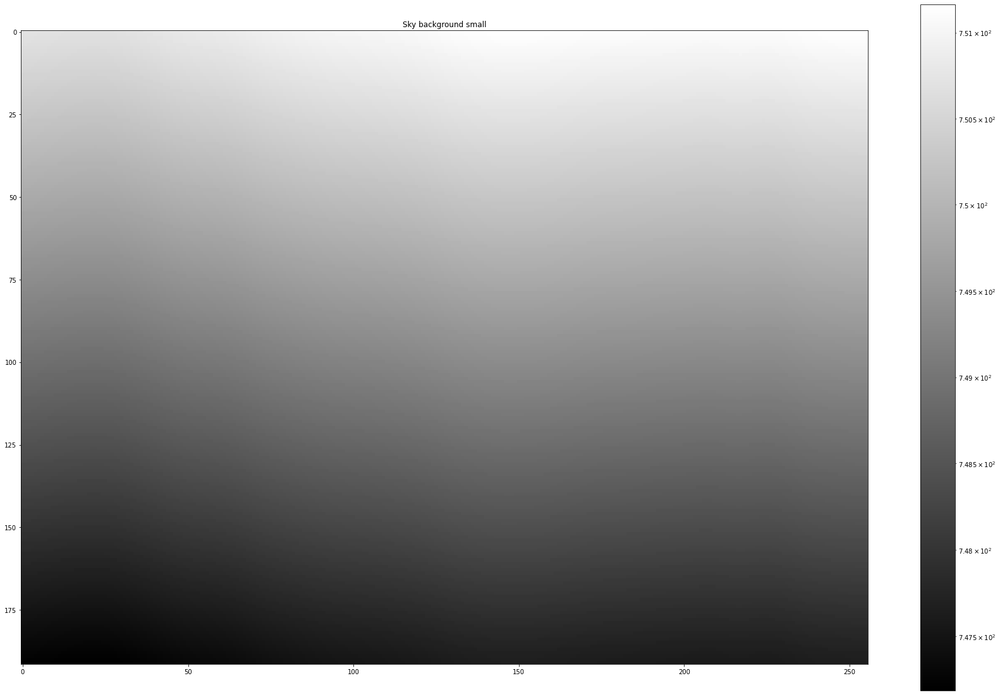

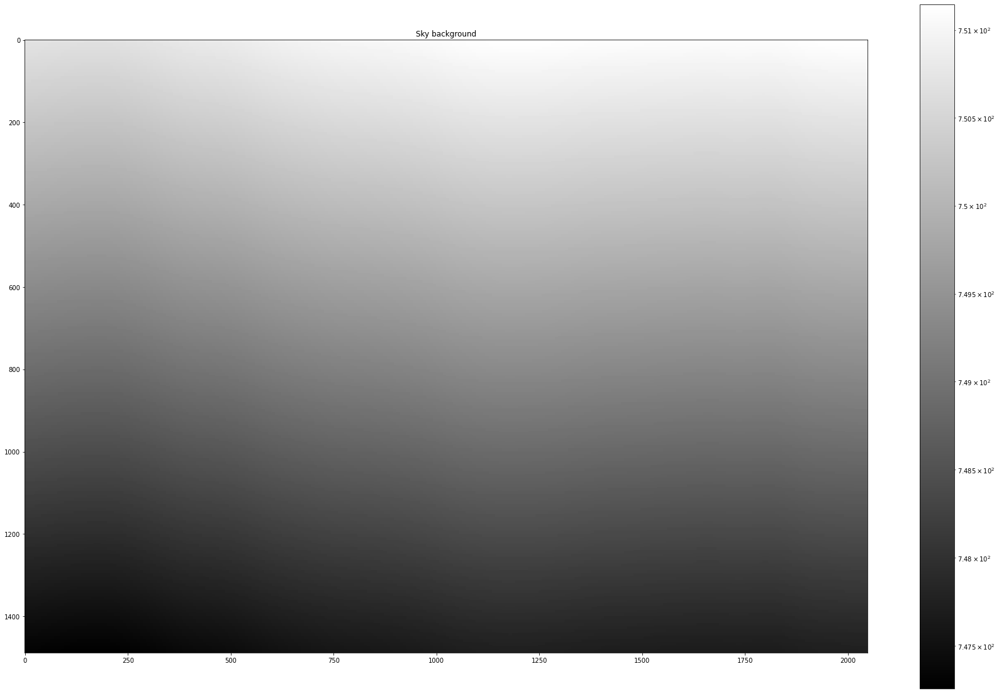

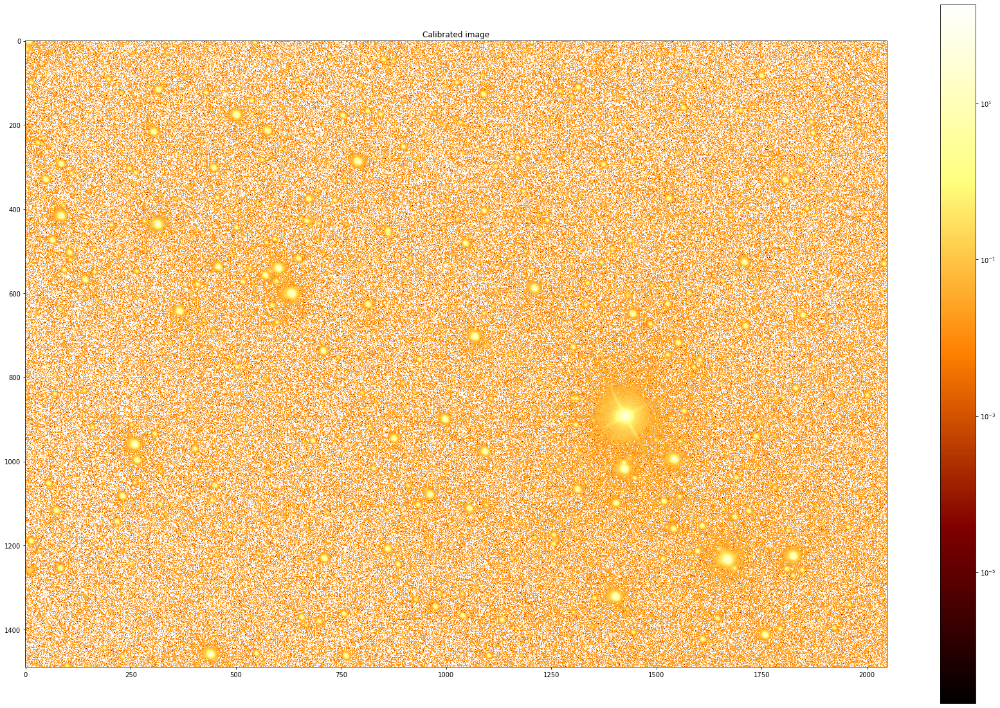

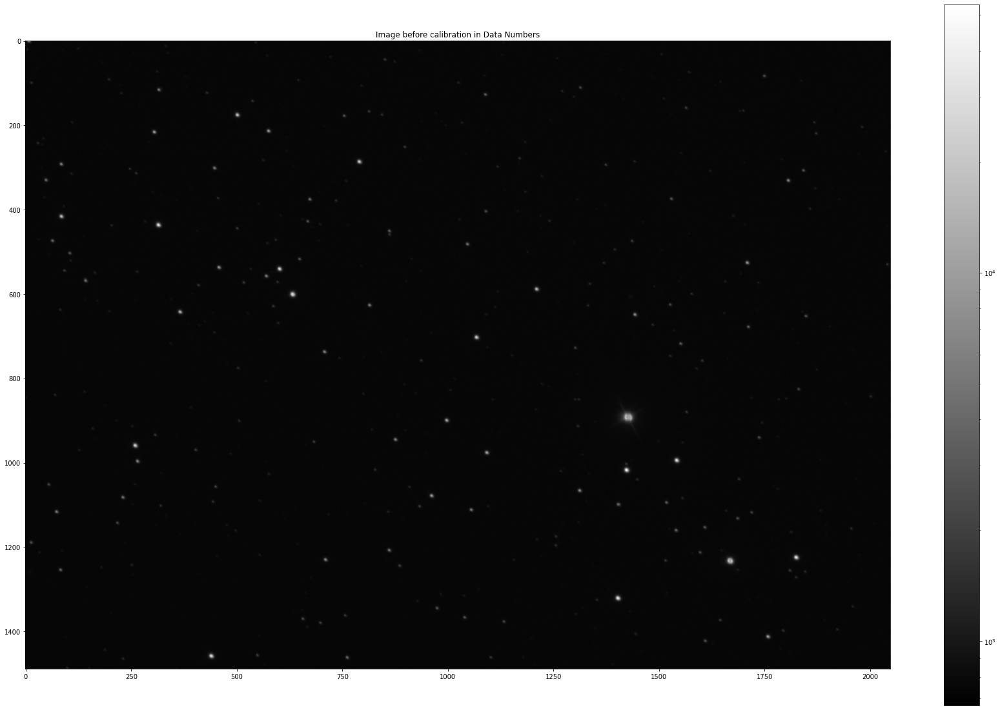

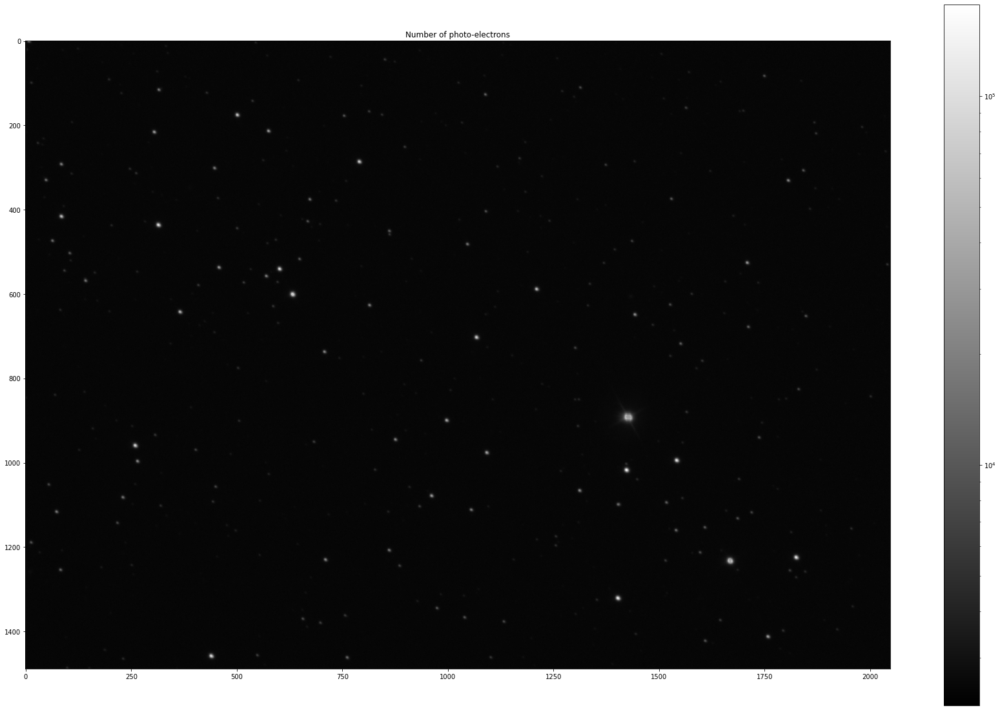

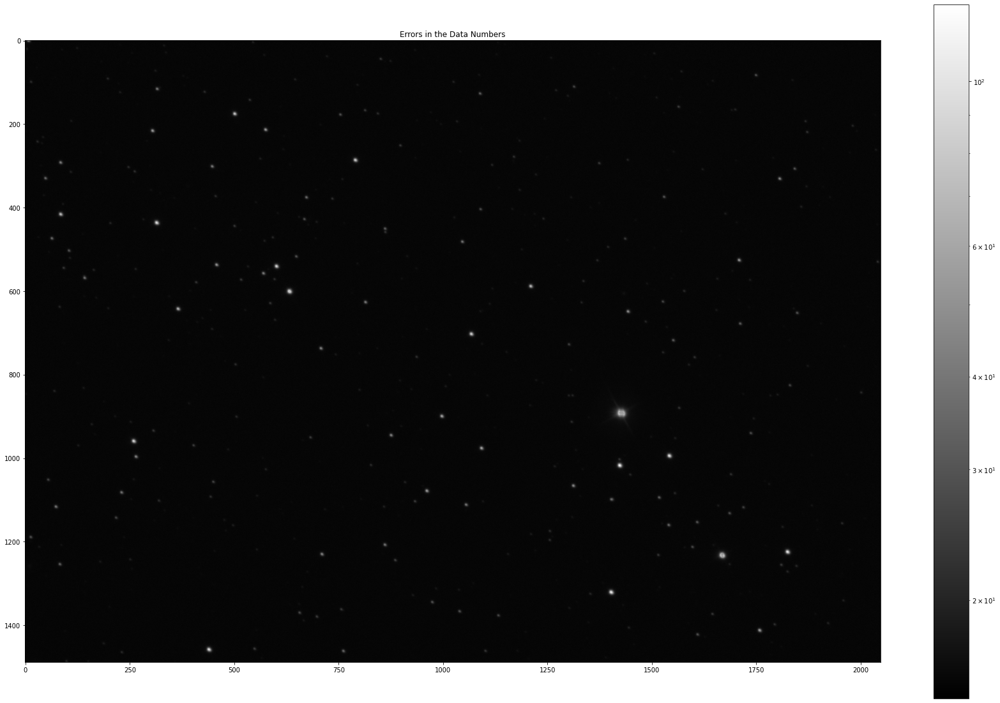

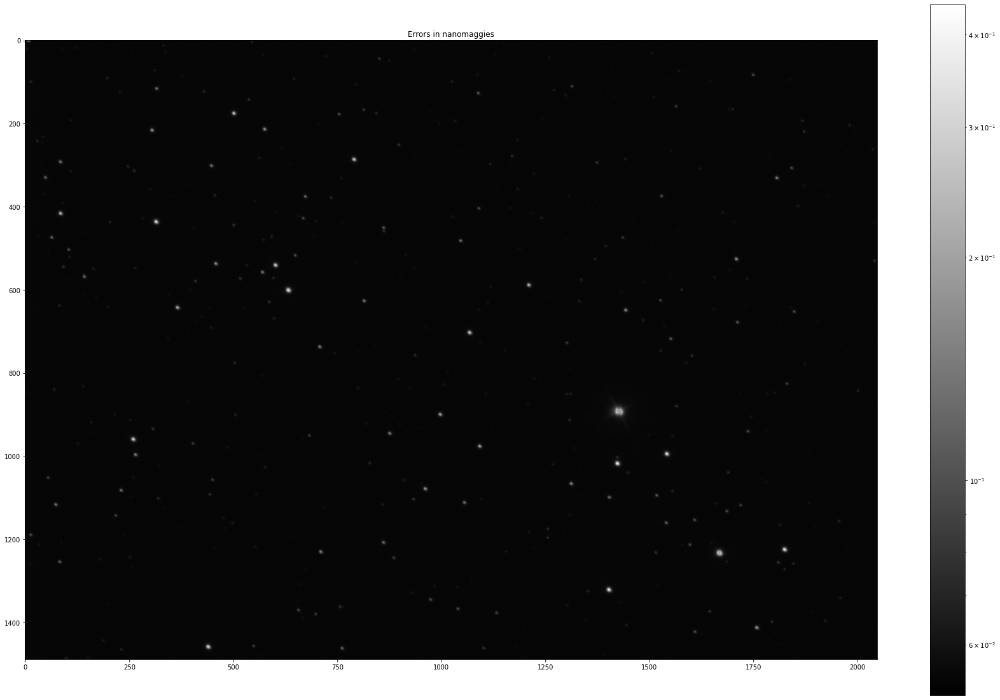

/home/caucau/SDSSCube/venv3/lib/python3.7/site-packages/matplotlib/colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


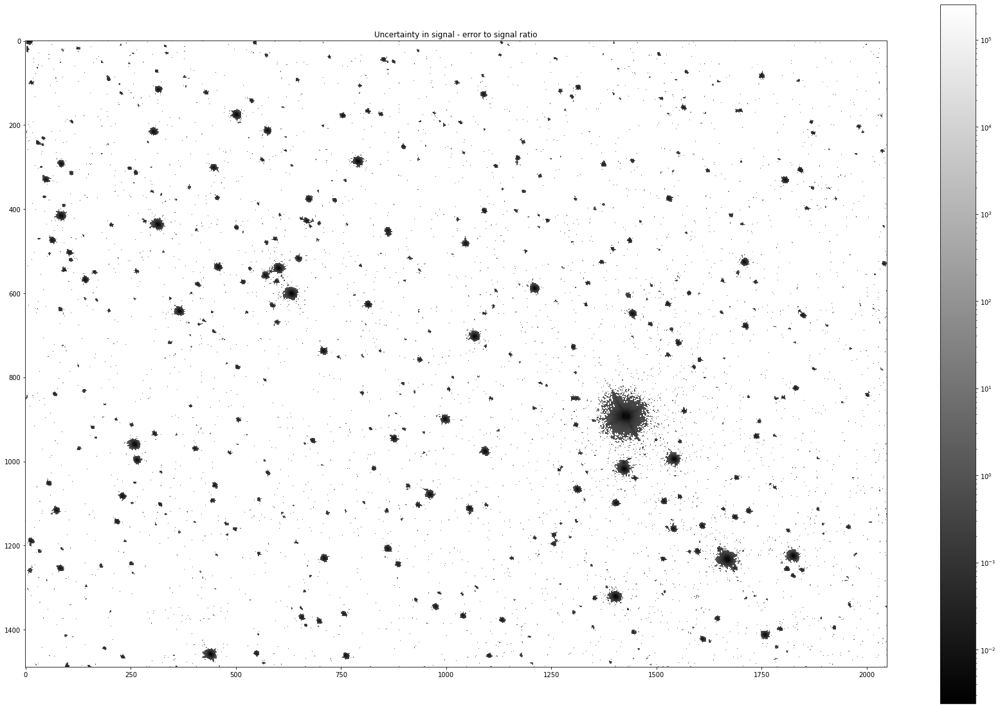

In [2]:
from scipy import interpolate
from pprint import pprint
import matplotlib.pyplot as plt
import itertools
import numpy as np

def draw_plots(img, img_err, allsky, simg, cimg, dn, nelec, dn_err, err_to_signal):
    plt.figure(figsize=(30,20))
    plt.imshow(allsky, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Sky background small")

    plt.figure(figsize=(30,20))
    plt.imshow(simg, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Sky background")

    plt.figure(figsize=(30,20))
    plt.imshow(img, cmap='afmhot', norm=LogNorm())
    plt.colorbar()
    plt.title("Calibrated image")

    plt.figure(figsize=(30,20))
    plt.imshow(dn, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Image before calibration in Data Numbers")

    plt.figure(figsize=(30,20))
    plt.imshow(nelec, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Number of photo-electrons")

    plt.figure(figsize=(30,20))
    plt.imshow(dn_err, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Errors in the Data Numbers")

    plt.figure(figsize=(30,20))
    plt.imshow(img_err, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Errors in nanomaggies")

    plt.figure(figsize=(30,20))
    plt.imshow(err_to_signal, cmap='gray', norm=LogNorm())
    plt.colorbar()
    plt.title("Uncertainty in signal - error to signal ratio")

def get_image_with_errors(fitsPath):
    with fitsio.FITS(fitsPath) as f:
        fits_header = f[0].read_header()
        img = f[0].read()
        x_size = fits_header["NAXIS1"]
        y_size = fits_header["NAXIS2"]
        camcol = fits_header['CAMCOL']
        run = fits_header['run']
        band = fits_header['filter']    
        allsky = f[2]['allsky'].read()[0]
        xinterp = f[2]['xinterp'].read()[0]
        yinterp = f[2]['yinterp'].read()[0]


        gain = float(cube_utils.get_ccd_gain(camcol, run, band))
        darkVariance = float(cube_utils.get_dark_variance(camcol, run, band))

        grid_x, grid_y = np.meshgrid(xinterp, yinterp)

        orig_x, orig_y = np.meshgrid(np.arange(256),  np.arange(192))
        orig_coords = np.dstack((orig_y.ravel(), orig_x.ravel()))[0]

        simg = interpolate.griddata(orig_coords, allsky.ravel(), (grid_y, grid_x), method='nearest')

        calib = f[1].read()

        cimg = np.tile(calib, (y_size, 1)) #calibration image

        print(np.isnan(allsky).sum())


        dn = img /cimg + simg #data numbers

        nelec = dn*gain #number of electrons

        dn_err = np.sqrt(dn/gain + darkVariance) #data number errors

        img_err= dn_err*cimg  #image errors in nanomaggies

        err_to_signal = img_err / img
        
        return img, img_err, allsky, simg, cimg, dn, nelec, dn_err, err_to_signal
    
    
img, img_err, allsky, simg, cimg, dn, nelec, dn_err, err_to_signal = get_image_with_errors(test_image)
draw_plots(img, img_err, allsky, simg, cimg, dn, nelec, dn_err, err_to_signal)

# Extracting spectrum errors
For the spectrum the SDSS has made life much more easy for us as the inverse variance of the measurement is already stored in the fits files. We just need to convert both to nano-maggies to be able to compare it with image photometry, as it is in '1E-17 erg/cm^2/s/Ang' units.

[3.5804 3.5805 3.5806 ... 3.9643 3.9644 3.9645]


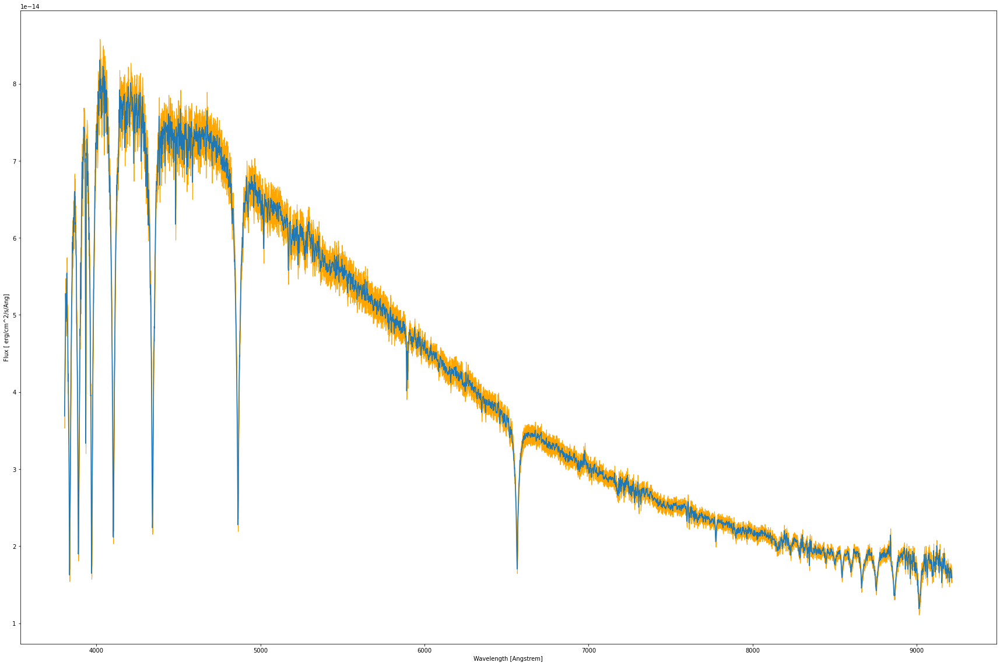

In [3]:
def plot_spec(fits_path):
    with fitsio.FITS(fits_path) as hdul:
        data = hdul[1].read()
        flux = data["flux"] * 1e-17
        sigma =  np.sqrt(np.divide(1,data["ivar"])) * 1e-17
        wl = np.power(10, data["loglam"])
        print(data["loglam"])
        plt.figure(figsize=(30,20))
        ax = plt.axes(xlabel="Wavelength [Angstrem]", ylabel="Flux [ erg/cm^2/s/Ang]")
        ax.plot(wl, flux)
        ax.fill_between(wl, flux - sigma, flux + sigma, color="orange")
        return wl, flux, sigma

spec_wl, spec_flux, spec_sigma = plot_spec(test_spectrum)


# Getting Filter transmission curves
We are not able to compare directly spectroscopic measurements with photometric ones. However, we can approximate this by applying the filter transmission curves to the spectrum and thus simulate values that would be measured to photon counts reduced by filter transmission function.

Below we show how the transmission curve looks like throught the whole spectrograph range. We take the transmission curves for individual filters and take the maximum transmission ratio for each wavelength, which essentially gets rid of the filter overlaps. We can do this because the image coordinates are the mid_points of those filters which are no in the overlapping regions anyway, so there will be no ambiguity to which filter should be applied in those regions.

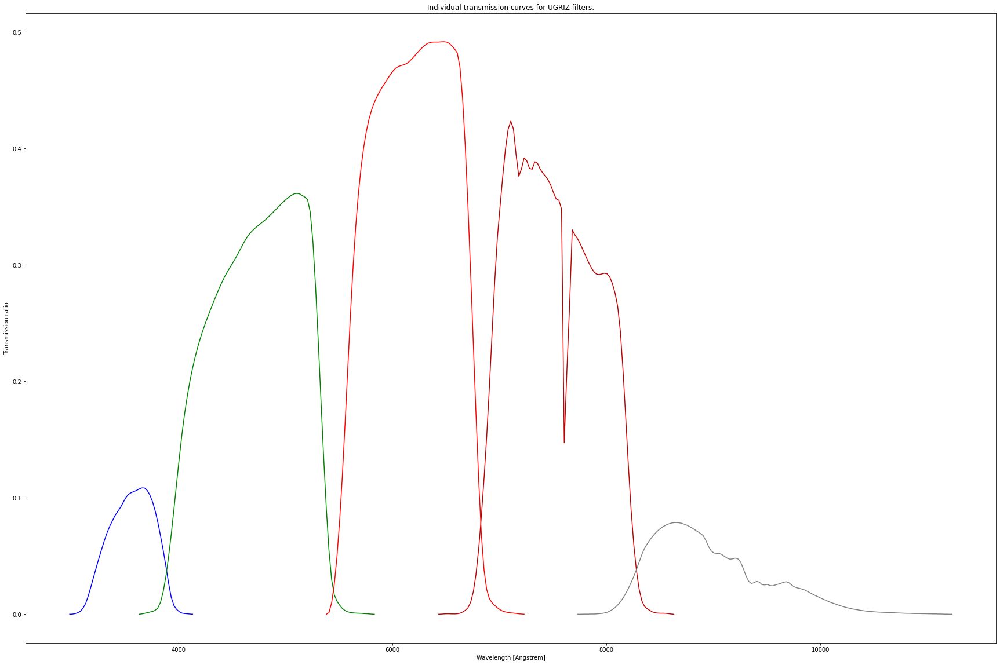

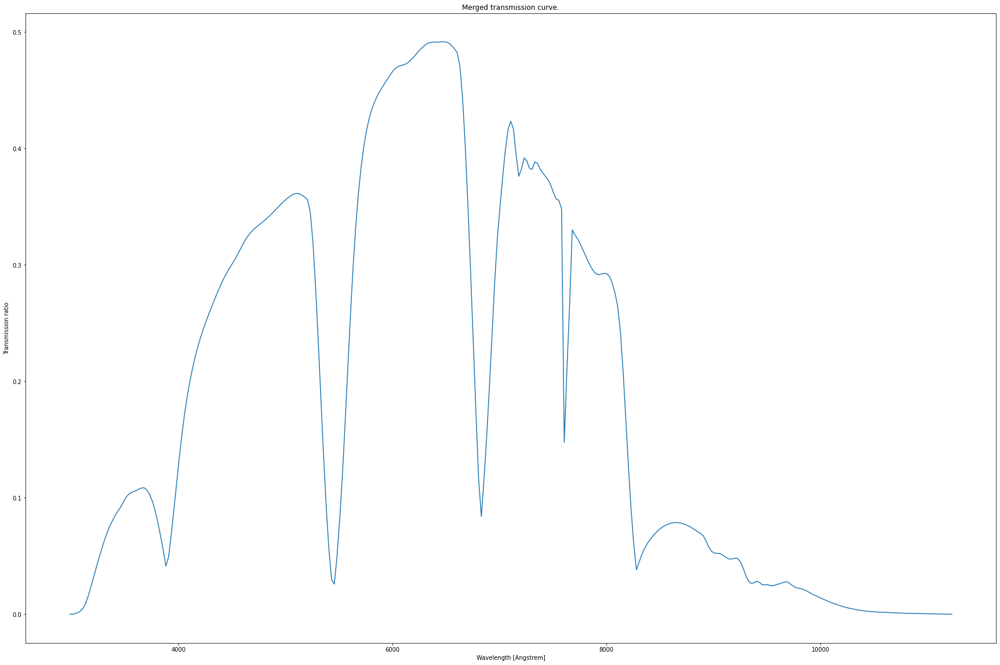

In [4]:
u = cube_utils.transmission_curves["u"]
g = cube_utils.transmission_curves["g"]
r = cube_utils.transmission_curves["r"]
i = cube_utils.transmission_curves["i"]
z = cube_utils.transmission_curves["z"]

merged_transmission_curve = cube_utils.merged_transmission_curve

wl, band_ratio = zip(*list(merged_transmission_curve.items()))
band, ratio = zip(*list(band_ratio))
u_wl, u_ratio = zip(*list(u.items()))
g_wl, g_ratio = zip(*list(g.items()))
r_wl, r_ratio = zip(*list(r.items()))
i_wl, i_ratio = zip(*list(i.items()))
z_wl, z_ratio = zip(*list(z.items()))



plt.figure(figsize=(30,20))
ax_u = plt.axes(xlabel="Wavelength [Angstrem]", ylabel="Transmission ratio")
ax_u = ax_u.plot(u_wl, u_ratio, color="blue")
ax_g = plt.plot(g_wl, g_ratio, color="green")
ax_r = plt.plot(r_wl, r_ratio, color="red")
ax_i = plt.plot(i_wl, i_ratio, color="#BF0000")
ax_z = plt.plot(z_wl, z_ratio, color="grey")
plt.title("Individual transmission curves for UGRIZ filters.")

plt.figure(figsize=(30,20))
ax_merged = plt.axes(xlabel="Wavelength [Angstrem]", ylabel="Transmission ratio")
ax_merged = plt.plot(wl, ratio)
plt.title("Merged transmission curve.")

print()

# Applied transmission curve
This is how the spectrum looks like when the photometric transmission curve is applied.
Procedure:
1. Multiply magnitude in each wavelength with the transmission curve ratio in that wavelength.

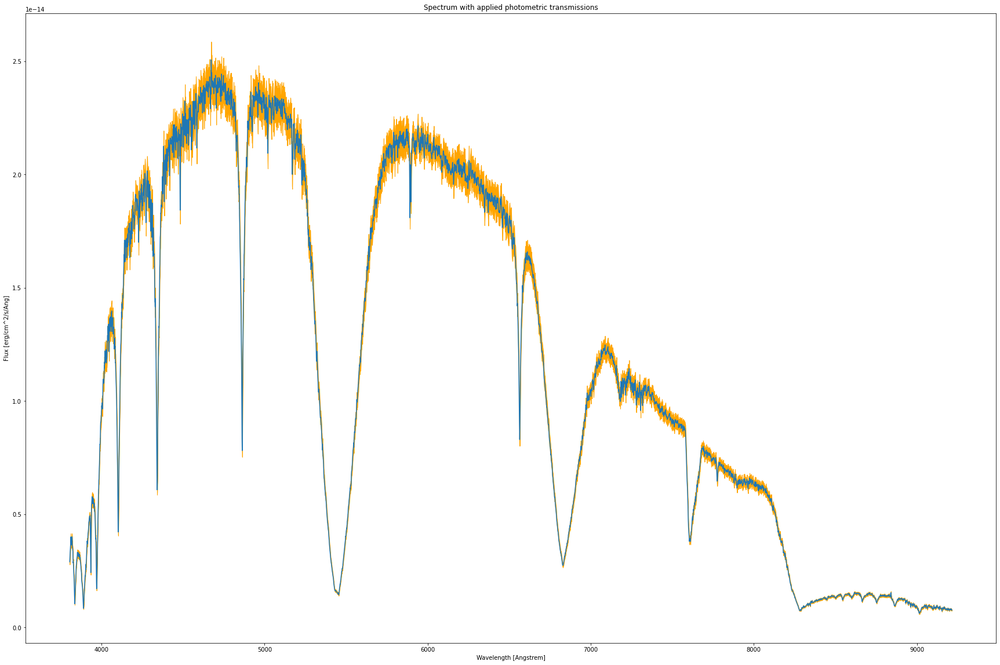

In [5]:
spec_wl, spec_flux, spec_sigma
transmission_ratio, zero_point, softening = cube_utils.get_photometry_params(spec_flux, spec_wl)

photometric_observed_spectrum_flux = spec_flux * transmission_ratio
photometric_observed_spectrum_flux_sigma =  spec_sigma * transmission_ratio# ?? - this is not correct, how shoul we transform variances

plt.figure(figsize=(30,20))
ax1 = plt.axes(xlabel="Wavelength [Angstrem]", ylabel="Flux [erg/cm^2/s/Ang]")
ax1.plot(spec_wl, photometric_observed_spectrum_flux)
ax1.fill_between(spec_wl, 
                photometric_observed_spectrum_flux - photometric_observed_spectrum_flux_sigma, 
               photometric_observed_spectrum_flux + photometric_observed_spectrum_flux_sigma, 
              color="orange")
plt.title("Spectrum with applied photometric transmissions")
print()

# Constructing multiple resolution spectrum
Here we show how the multiple resolution spectrum is constructed, with the same algorithm as above:
1. In Fluxes without photometric transmission applied
2. In Magnitudes without photometric transmission applied
3. In Magnitudes with photomoetric transmission applied

For each of these, we construct the lower resolutions down to the MIN_RES setting (Each lower resolution is half of the upper one, meaning we get spectral resolutions e.g. (4620, 2310, 1155, etc.)

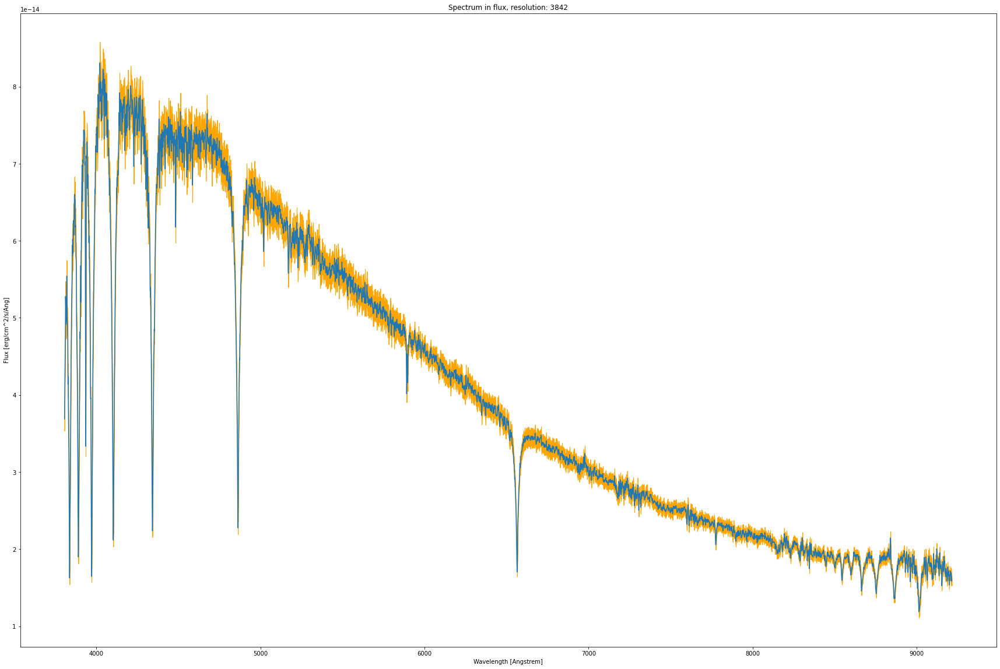

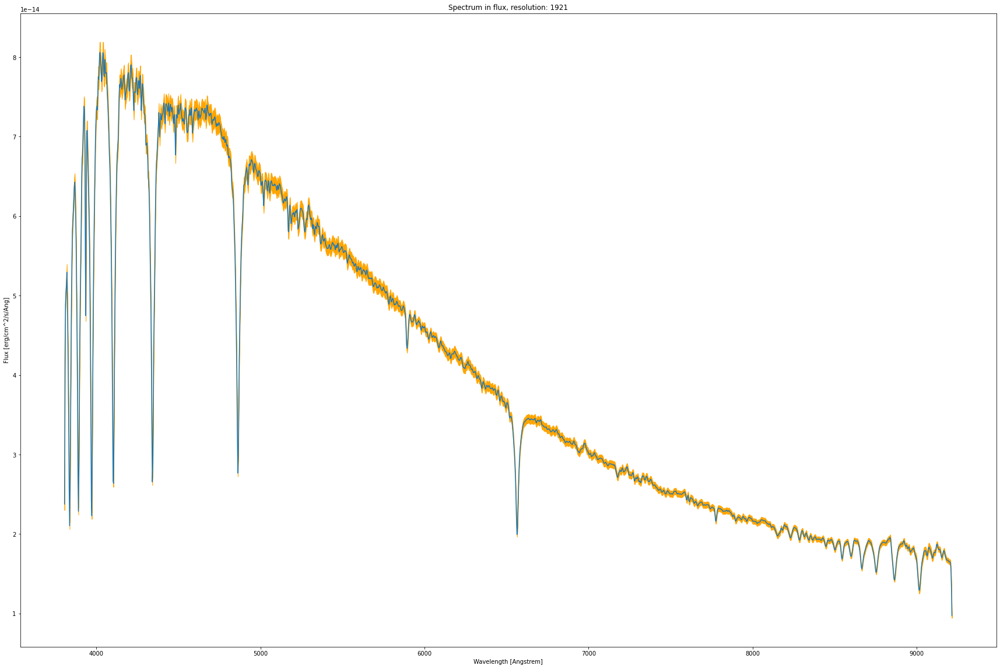

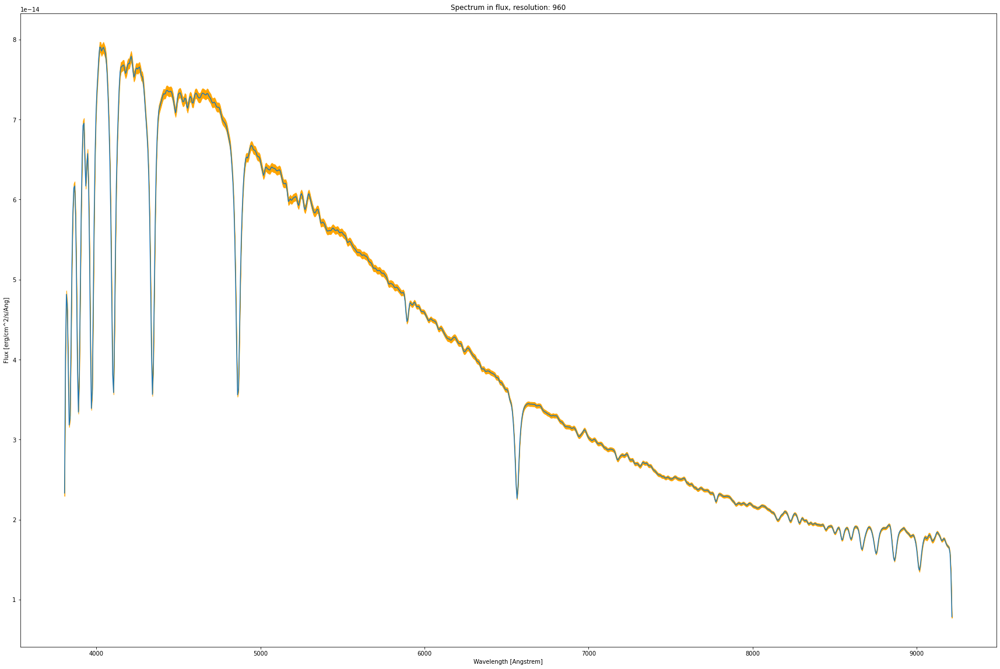

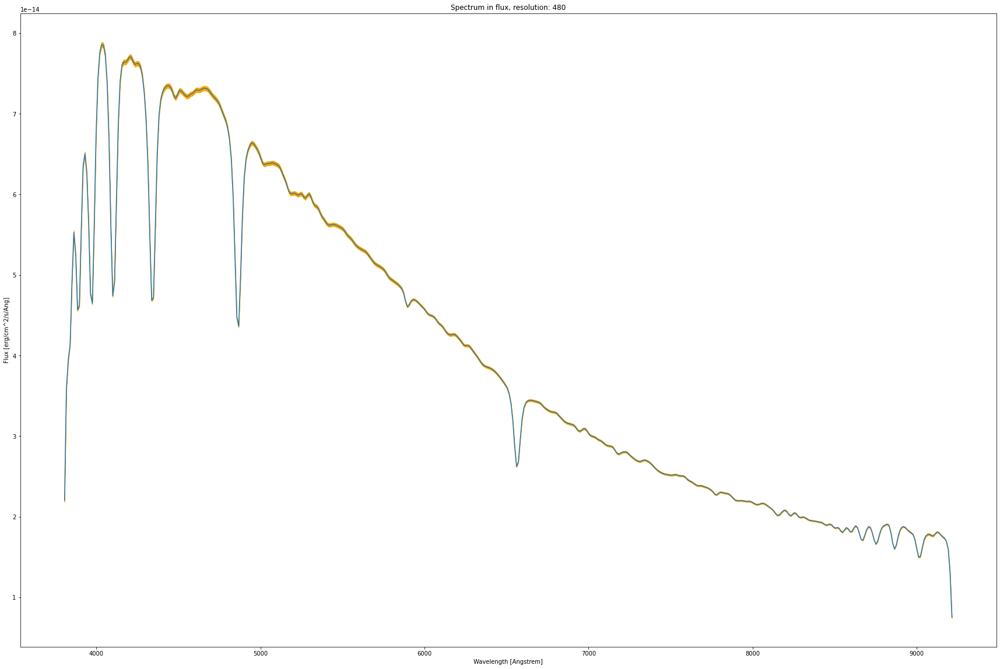

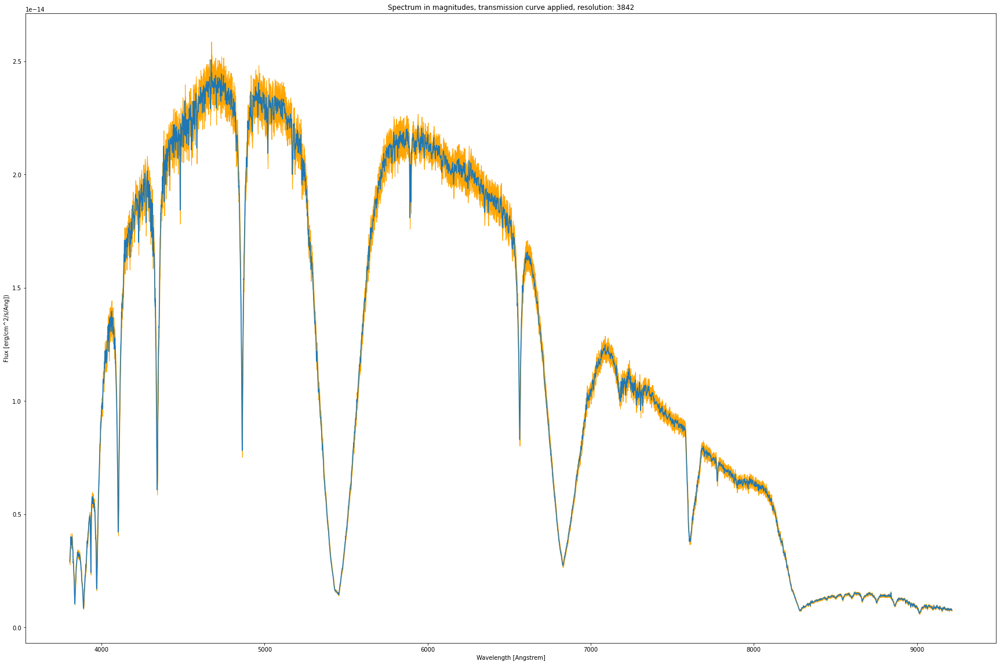

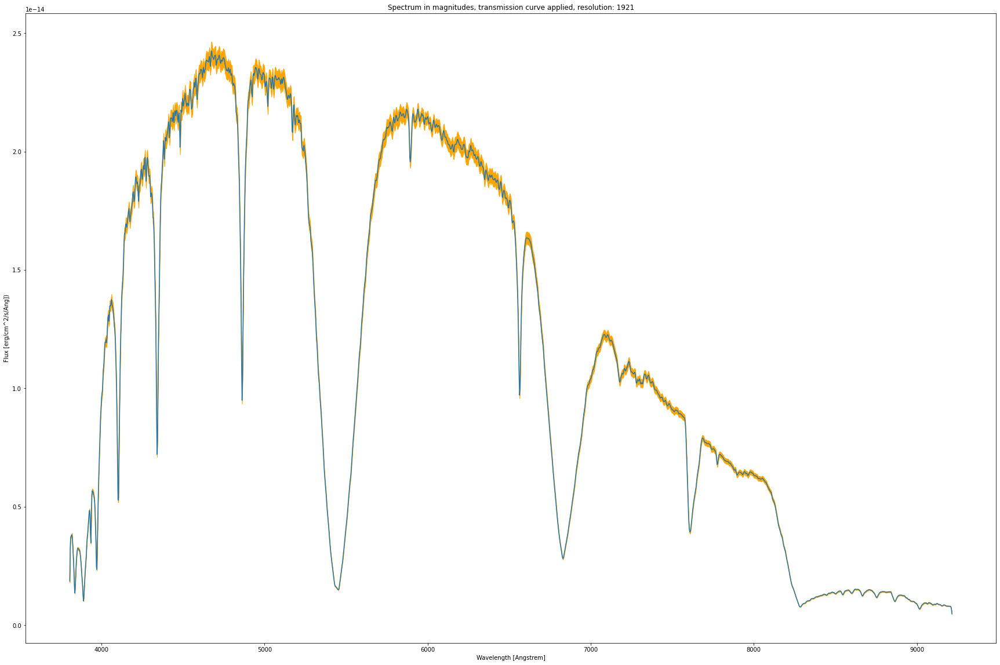

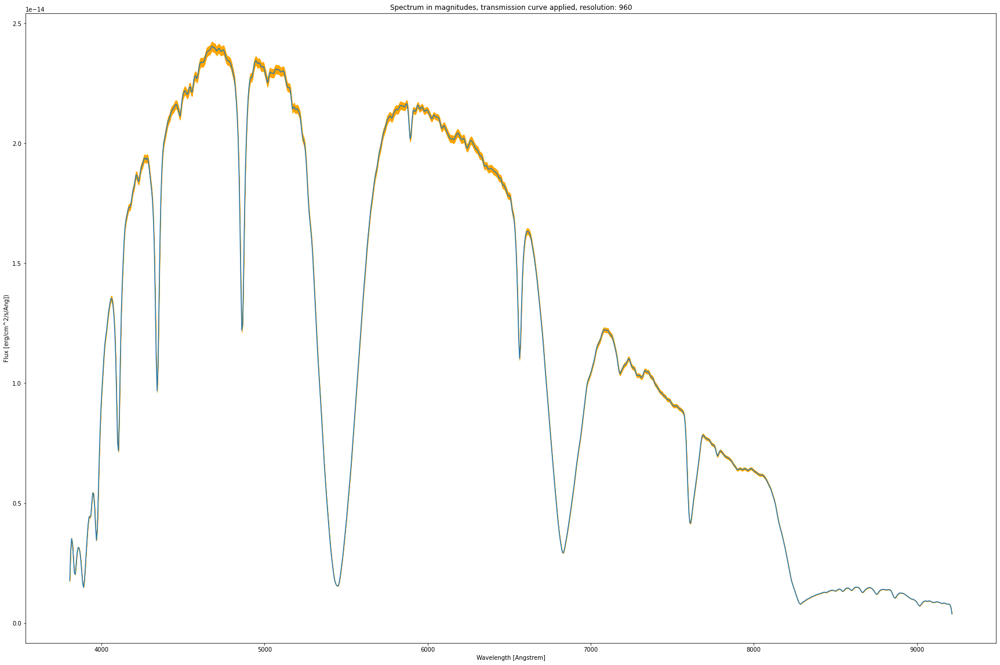

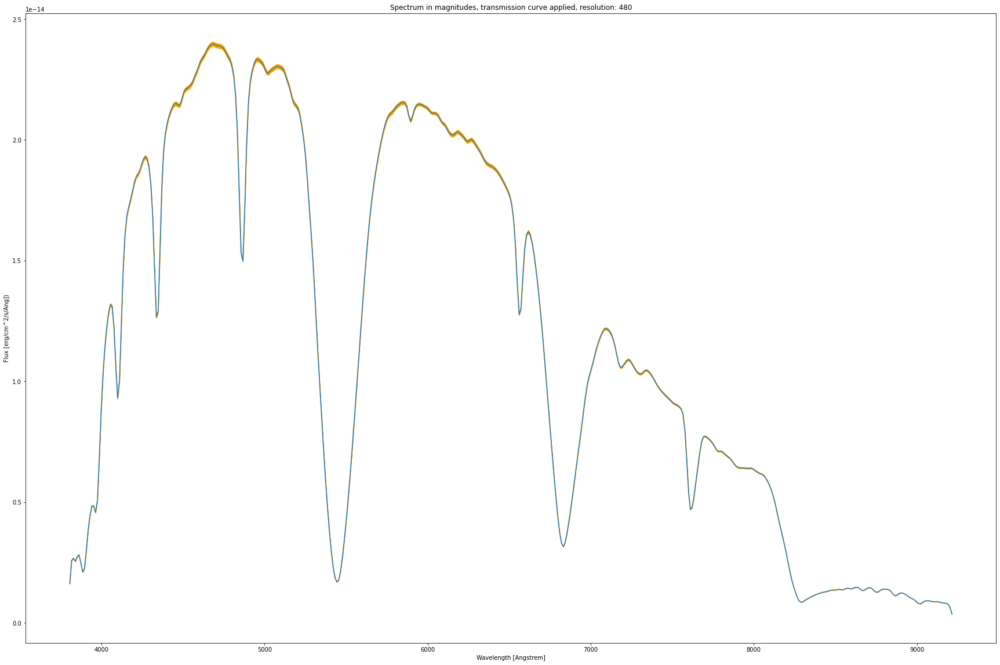

In [6]:
MIN_RES = 256
reload(utils)
cube_utils = utils.CubeUtils("config/SDSS_Bands",
                                   "config/ccd_gain.tsv",
                                   "config/ccd_dark_variance.tsv")

def plot_cube(res_cube, trans_txt, y_unit):
    for spec in res_cube:
        wl = spec["wl"]
        flux = spec["flux_mean"]
        flux_sigma = spec["flux_sigma"]
        plt.figure(figsize=(30,20))
        ax = plt.axes(xlabel="Wavelength [Angstrem]", ylabel=y_unit)
        ax.plot(wl, flux)
        ax.fill_between(wl, 
                        flux - flux_sigma, 
                        flux + flux_sigma, 
                        color="orange")
        plt.title("%s, resolution: %s" %(trans_txt, spec["res"]))
MIN_RES = 256

fits_header, spec_cube = cube_utils.get_multiple_resolution_spectrum(test_spectrum,
                                                                                  MIN_RES,
                                                                                  apply_transmission=False)
fits_header, spec_cube_with_transmission = cube_utils.get_multiple_resolution_spectrum(test_spectrum,
                                                                                  MIN_RES,
                                                                                  apply_transmission=True)
plot_cube(spec_cube, "Spectrum in flux", "Flux [erg/cm^2/s/Ang]")
plot_cube(spec_cube_with_transmission, "Spectrum in magnitudes, transmission curve applied", 
          "Flux [erg/cm^2/s/Ang])")      

# In this cell we show how we construct the lower resolutions for images.
We use bilinear interpolation to construct the lower resolutions, both for image measurements and their sigmas, while for each lower resolution, the sigma is halved

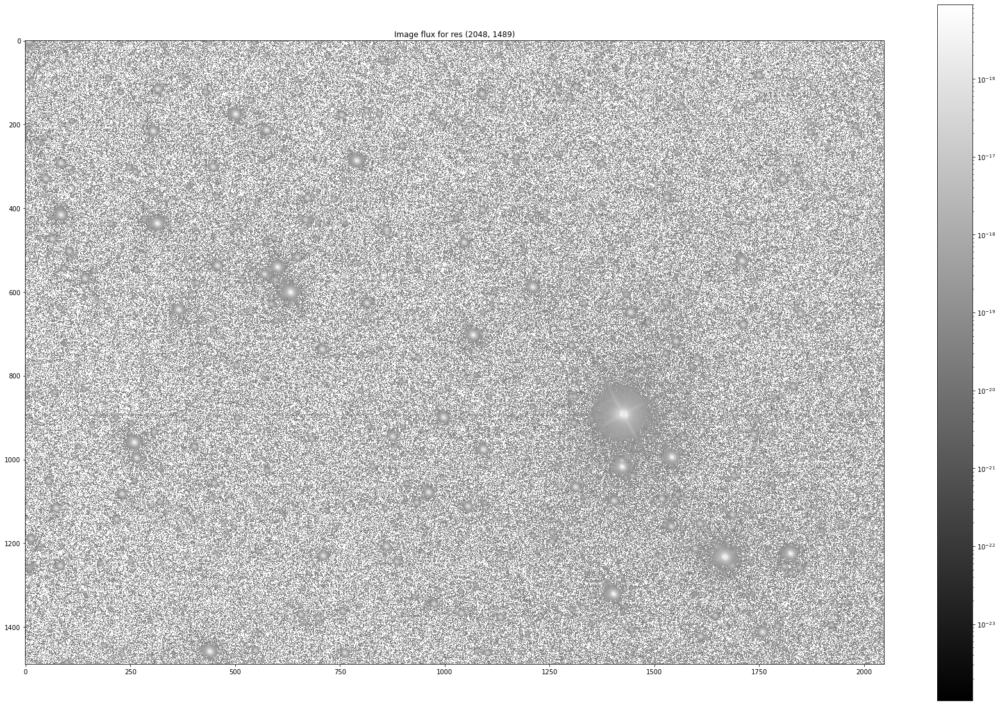

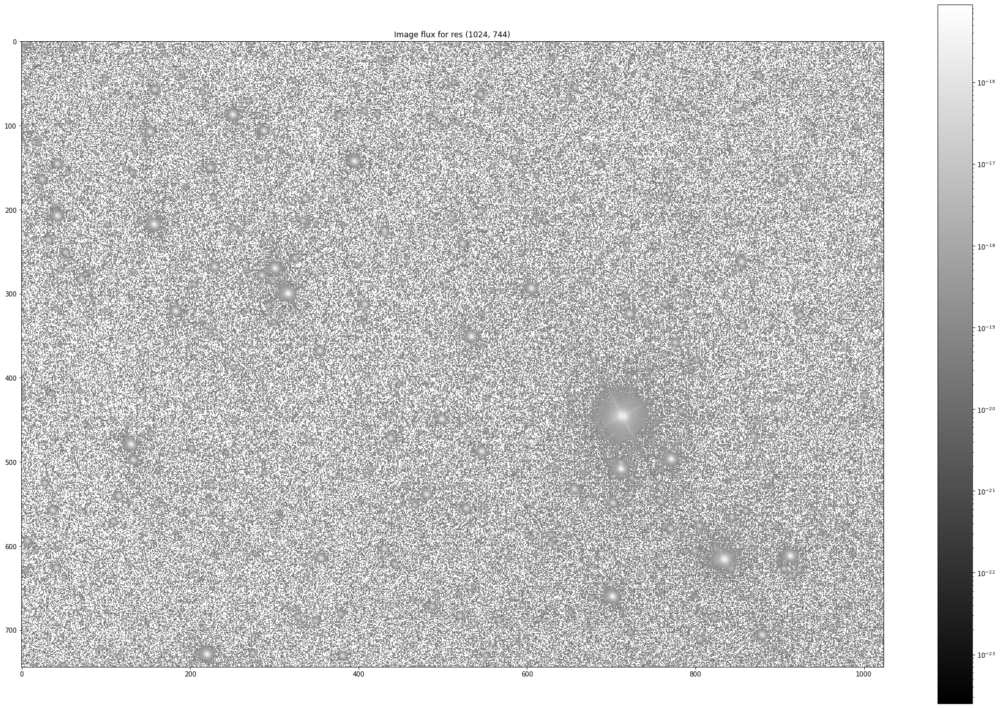

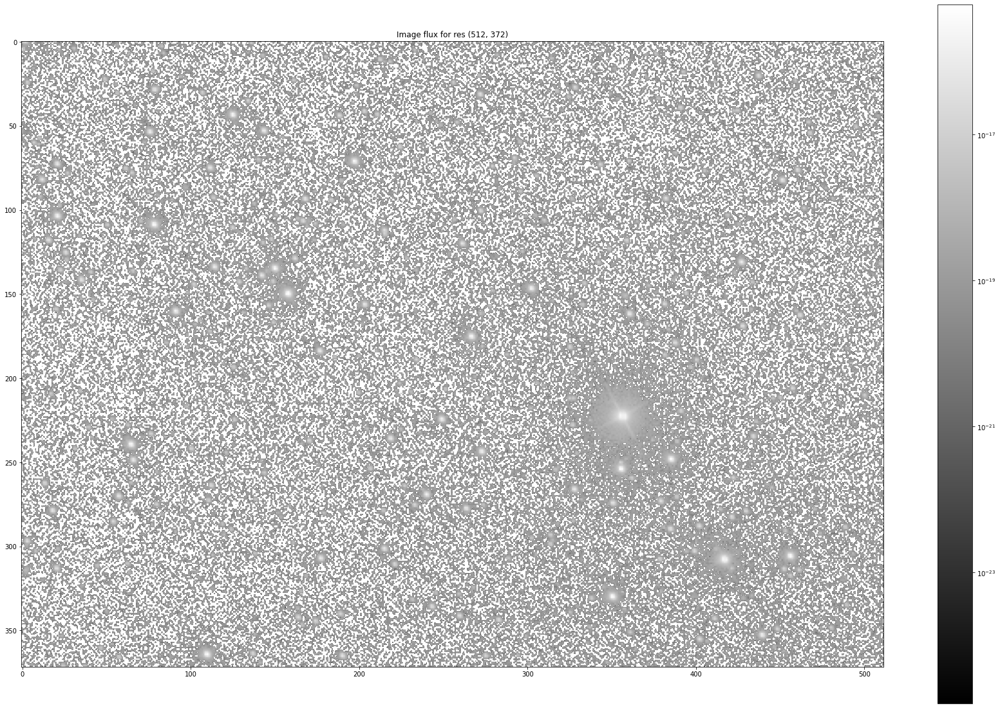

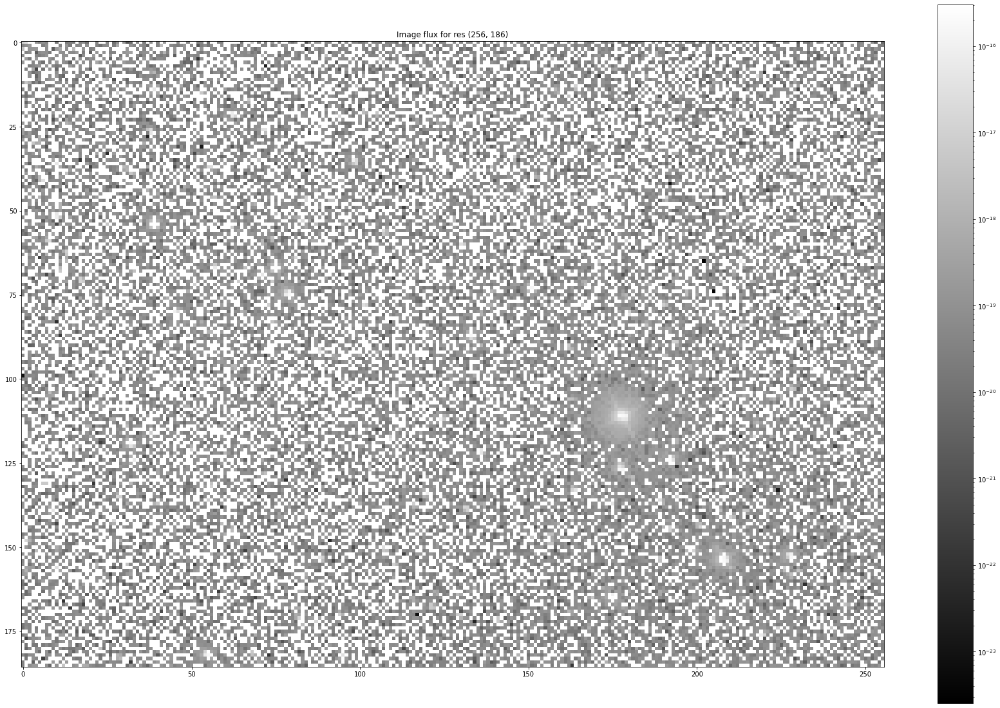

In [7]:
MIN_RES = 128
reload(utils)
cube_utils = utils.CubeUtils("config/SDSS_Bands",
                                   "config/ccd_gain.tsv",
                                   "config/ccd_dark_variance.tsv")

def plot_image_cube(res_cube):
    for img in res_cube:
        plt.figure(figsize=(30,20))
        plt.imshow(img["flux_mean"], cmap='gray',  norm=LogNorm())
        plt.colorbar()
        plt.title("Image flux for res %s" %(str(img["res"])))
        #plt.figure(figsize=(30,20))
        #plt.imshow(img["flux_sigma"], cmap='gray')
        #plt.colorbar()
        #plt.title("Image variance for res %s" %(str(img["res"])))
       
        

fits_header, image_cube = cube_utils.get_multiple_resolution_image(test_image, MIN_RES)

plot_image_cube(image_cube)



        
        
        

# Constructing database in HDF5 file
In this step we load the images and spectra, with their preprocessing applied above, into HDF5 file. Effectively we combine independently measured spectra and images into one sparse spectral cube that contains all the datapoints with comparable values.

Steps involved:
1. Create indexing structure to enable spatial, temporal, spectral and resolution-wise searching of the datasets.
2. Preprocess the images and spectra to construct lower resolutions and uncertainties.

In [5]:
reload (h5w)
import warnings
from astropy.utils.exceptions import AstropyWarning
from tqdm import tqdm, tqdm_notebook
from mpi4py import MPI

comm = MPI.COMM_WORLD     # communicator which links all our processes together
rank = comm.Get_rank()    # number which identifies this process
no_processes = comm.Get_size()    # number of processes in a communicator


warnings.simplefilter('ignore', category=AstropyWarning)

with h5py.File(h5_path, 'w') as h5_file: #truncate file
    writer = h5w.SDSSCubeWriter(h5_file, cube_utils)
    image_paths = list(Path(image_folder).rglob(test_images))
    no_images = len(image_paths)
    chunk = ceil (no_images / no_processes)
    start_it = rank * chunk
    end_it = start + chunk if start + chunk <= no_images else no_images
    my_image_paths = image_paths[start_it:end_it]
    for image in tqdm(my_image_paths, desc="Image Progress, worker %d: " %rank):
        writer.ingest_image(image)

NameError: name 'h5w' is not defined

In [ ]:
with h5py.File(h5_path, 'r+') as h5_file:
    writer = h5w.SDSSCubeWriter(h5_file, cube_utils)
    spectra_paths = list(Path(spectra_folder).rglob(test_spectra))
    for spectrum in tqdm(spectra_paths, desc="Spectra Progress: "):
        writer.ingest_spectrum(spectrum)

In [9]:
reload (h5r)
from astropy.samp import SAMPIntegratedClient
from urllib.parse import urljoin
from scripts import SDSSCubeReader as h5r
import os

with h5py.File(h5_path, 'r') as h5_file:
    h5_reader = h5r.SDSSCubeReader(h5_file, cube_utils)
    h5_reader.get_spectral_cube_for_res(0)
    h5_reader.write_VOTable("data/output.xml")


client = SAMPIntegratedClient()
client.connect()

params = {}
params["url"] = urljoin('file:', os.path.abspath("data/output.xml"))
params["name"] = "SDSS Cube"
print(params["url"])

message = {}
message["samp.mtype"] = "table.load.votable"
message["samp.params"] = params

client.notify_all(message)

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970/18191882/72767529/55455/4621/spec-4238-55455-0037.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970/18191882/72767529/55455/4621/spec-4238-55455-0037.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970/18191882/72767529/55455/4621/spec-4238-55455-0037.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970/18191882/72767529/55455/4621/spec-4238-55455-0037.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970/18191882/72767529/56219/4623/spec-3615-56219-0029.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970/18191882/72767529/55241/4617/spec-3647-55241-0078.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970/18191882/72767529/55241/4617/spec-3647-55241-0078.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970/18191882/72767529/55241/4617/spec-3647-55241-0078.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970/18191882/72767529/55179/4626/spec-3615-55179-0031.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970/18191882/72767529/55179/4626/spec-3615-55179-0031.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547970

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56577/4622/spec-6780-56577-0035.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55208/4627/spec-3615-55208-0008.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55208/4627/spec-3615-55208-0008.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55208/4627/spec-3615-55208-0008.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55208/4627/spec-3615-55208-0008.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56544/4626/spec-3615-56544-0018.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55179/4626/spec-3615-55179-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55179/4626/spec-3615-55179-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55179/4626/spec-3615-55179-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55179/4626/spec-3615-55179-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55827/4640/spec-3647-55827-0009.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55827/4640/spec-3647-55827-0009.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56219/4623/spec-3615-56219-0006.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56219/4623/spec-3615-56219-0006.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56219/4623/spec-3615-56219-0006.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56568/4629/spec-3647-56568-0003.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55445/4621/spec-3615-55445-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55445/4621/spec-3615-55445-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55445/4621/spec-3615-55445-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/55445/4621/spec-3615-55445-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56267/4628/spec-6780-56267-0027.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56605/4622/spec-6780-56605-0027.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56605/4622/spec-6780-56605-0027.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56605/4622/spec-6780-56605-0027.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191884/72767538/56605/4622/spec-6780-56605-0027.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191885/72767543/52942/3843/spec-1509-52942-0111.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191885/72767543/52942/3843/spec-1509-52942-0111.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191885/72767543/52942/3843/spec-1509-52942-0111.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191885/72767543/52942/3843/spec-1509-52942-0111.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971/18191885/72767543/56684/4629/spec-7330-56684-0437.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136992/4547971

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/56568/328/spec-3647-56568-0016.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/56568/328/spec-3647-56568-0016.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/56568/328/spec-3647-56568-0016.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/56568/328/spec-3647-56568-0016.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/56568/328/spec-3647-56568-0016.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/1819

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/55476/4617/spec-3647-55476-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/55476/4617/spec-3647-55476-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/55476/4617/spec-3647-55476-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/55476/4617/spec-3647-55476-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/55476/4617/spec-3647-55476-0014.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/55181/4623/spec-3647-55181-0034.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/55181/4623/spec-3647-55181-0034.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/56219/4626/spec-3647-56219-0012.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/56219/4626/spec-3647-56219-0012.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767588/56219/4626/spec-3647-56219-0012.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767591/55209/4623/spec-3744-55209-0199.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767591/55209/4623/spec-3744-55209-0199.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767591/55209/4623/spec-3744-55209-0199.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767591/55209/4623/spec-3744-55209-0199.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191897/72767591/55209/4623/spec-3744-55209-0199.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55208/4627/spec-3615-55208-0004.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55208/4627/spec-3615-55208-0004.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55208/4627/spec-3615-55208-0004.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/56219/4623/spec-3615-56219-0012.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/56219/4623/spec-3615-56219-0012.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55181/4623/spec-3647-55181-0032.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55181/4623/spec-3647-55181-0032.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55181/4623/spec-3647-55181-0032.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55181/4623/spec-3647-55181-0032.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55181/4623/spec-3647-55181-0032.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/51821/3807/spec-0408-51821-0311.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/51821/3807/spec-0408-51821-0311.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/51821/3807/spec-0408-51821-0311.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/51821/3807/spec-0408-51821-0311.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/51821/3807/spec-0408-51821-0311.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/56568/4629/spec-3647-56568-0004.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/56568/4629/spec-3647-56568-0004.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/56568/4629/spec-3647-56568-0004.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/56568/4629/spec-3647-56568-0004.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/56568/4629/spec-3647-56568-0004.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55945/4640/spec-3647-55945-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55945/4640/spec-3647-55945-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55945/4640/spec-3647-55945-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55945/4640/spec-3647-55945-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191898/72767593/55945/4640/spec-3647-55945-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191896/72767586/52992/3805/spec-1510-52992-0307.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191896/72767586/52992/3805/spec-1510-52992-0307.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191896/72767586/52992/3805/spec-1510-52992-0307.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191896/72767584/52641/3845/spec-1071-52641-0086.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974/18191896/72767584/52641/3845/spec-1071-52641-0086.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547974

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/55241/4618/spec-3647-55241-0029.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/55241/4618/spec-3647-55241-0029.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/55241/4618/spec-3647-55241-0029.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/55241/4618/spec-3647-55241-0029.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/55241/4618/spec-3647-55241-0029.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/56219/4623/spec-3615-56219-0013.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/56596/4628/spec-3647-56596-0015.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/56596/4628/spec-3647-56596-0015.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/56596/4628/spec-3647-56596-0015.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/56596/4628/spec-3647-56596-0015.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/55827/4640/spec-3647-55827-0013.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/55827/4640/spec-3647-55827-0013.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/55827/4640/spec-3647-55827-0013.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/55827/4640/spec-3647-55827-0013.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191902/72767609/55827/4640/spec-3647-55827-0013.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191903/72767612/56599/4629/spec-6781-56599-0398.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191903/72767612/56599/4629/spec-6781-56599-0398.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191903/72767612/56599/4629/spec-6781-56599-0398.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191903/72767612/56599/4629/spec-6781-56599-0398.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191903/72767612/56599/4629/spec-6781-56599-0398.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191903/72767614/55234/4624/spec-3745-55234-0618.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191903/72767614/55234/4624/spec-3745-55234-0618.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191903/72767614/55234/4624/spec-3745-55234-0618.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191903/72767614/55234/4624/spec-3745-55234-0618.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975/18191903/72767614/55234/4624/spec-3745-55234-0618.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547975

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547972/18191889/72767558/51821/3809/spec-0408-51821-0306.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547972/18191889/72767558/51821/3809/spec-0408-51821-0306.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547972/18191889/72767558/51821/3809/spec-0408-51821-0306.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547972/18191889/72767558/51821/3809/spec-0408-51821-0306.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547972/18191889/72767558/51821/3809/spec-0408-51821-0306.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136993/4547972

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191926/72767706/54835/3817/spec-3127-54835-0630.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191926/72767706/53271/3850/spec-1559-53271-0113.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191926/72767706/53271/3850/spec-1559-53271-0113.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191926/72767706/53271/3850/spec-1559-53271-0113.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191926/72767706/53271/3850/spec-1559-53271-0113.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191926/72767706/52942/3842/spec-1509-52942-0116.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191926/72767706/52942/3842/spec-1509-52942-0116.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191926/72767706/52942/3842/spec-1509-52942-0116.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191926/72767706/52942/3842/spec-1509-52942-0116.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191926/72767706/52942/3842/spec-1509-52942-0116.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191925/72767700/53317/3811/spec-1560-53317-0314.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191925/72767700/53317/3811/spec-1560-53317-0314.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191925/72767700/53317/3811/spec-1560-53317-0314.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191925/72767700/53317/3811/spec-1560-53317-0314.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191925/72767700/53317/3811/spec-1560-53317-0314.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191927/72767708/55455/4621/spec-4238-55455-0038.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191927/72767708/55455/4621/spec-4238-55455-0038.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191927/72767708/55455/4621/spec-4238-55455-0038.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191927/72767708/55455/4621/spec-4238-55455-0038.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981/18191927/72767708/55455/4621/spec-4238-55455-0038.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547981

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191930/72767722/55856/4642/spec-3615-55856-0040.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191930/72767722/55856/4642/spec-3615-55856-0040.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191930/72767722/55856/4642/spec-3615-55856-0040.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191930/72767722/55856/4642/spec-3615-55856-0040.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191930/72767722/55208/4627/spec-3615-55208-0028.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191928/72767715/55455/4621/spec-4238-55455-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191928/72767715/55455/4621/spec-4238-55455-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191928/72767715/55455/4621/spec-4238-55455-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191928/72767715/55455/4621/spec-4238-55455-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191928/72767715/55455/4621/spec-4238-55455-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191928/72767714/56577/4622/spec-6780-56577-0031.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191928/72767714/56577/4622/spec-6780-56577-0031.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191928/72767714/56605/4621/spec-6780-56605-0035.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191928/72767714/56605/4621/spec-6780-56605-0035.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191928/72767714/56605/4621/spec-6780-56605-0035.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191929/72767719/56684/4628/spec-7330-56684-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191929/72767719/56684/4628/spec-7330-56684-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191929/72767719/56684/4628/spec-7330-56684-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191929/72767719/56684/4628/spec-7330-56684-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547982/18191929/72767719/56684/4628/spec-7330-56684-0440.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/57030/3897/spec-7825-57030-0528.fits, message: cannot reshape array of size 8064 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/57030/3897/spec-7825-57030-0528.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/57030/3897/spec-7825-57030-0528.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/54835/3816/spec-3127-54835-0631.fits, message: cannot reshape array of size 512 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/54835/3816/spec-3127-54835-0631.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/54835/3816/spec-3127-54835-0631.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/56684/4628/spec-7330-56684-0439.fits, message: cannot reshape array of size 512 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/56684/4628/spec-7330-56684-0439.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/56684/4628/spec-7330-56684-0439.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/54804/3826/spec-3126-54804-0215.fits, message: cannot reshape array of size 512 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/54804/3826/spec-3126-54804-0215.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191934/72767738/54804/3826/spec-3126-54804-0215.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56605/4622/spec-6780-56605-0038.fits, message: cannot reshape array of size 6656 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56605/4622/spec-6780-56605-0038.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56605/4622/spec-6780-56605-0038.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56577/4623/spec-6780-56577-0038.fits, message: cannot reshape array of size 6656 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56577/4623/spec-6780-56577-0038.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56577/4623/spec-6780-56577-0038.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56238/4624/spec-6370-56238-0038.fits, message: cannot reshape array of size 6656 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56238/4624/spec-6370-56238-0038.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56238/4624/spec-6370-56238-0038.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56267/4628/spec-6780-56267-0038.fits, message: cannot reshape array of size 6656 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56267/4628/spec-6780-56267-0038.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767731/56267/4628/spec-6780-56267-0038.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits, message: cannot reshape array of size 1152 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits, message: cannot reshape array of size 896 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits, message: cannot reshape array of size 512 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits, message: cannot reshape array of size 512 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits, message: cannot reshape array of size 512 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits, message: cannot reshape array of size 128 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits, message: cannot reshape array of size 256 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits, message: cannot reshape array of size 1152 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56599/4628/spec-6781-56599-0440.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits, message: cannot reshape array of size 1152 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits, message: cannot reshape array of size 896 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits, message: cannot reshape array of size 512 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits, message: cannot reshape array of size 512 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits, message: cannot reshape array of size 512 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits, message: cannot reshape array of size 128 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits, message: cannot reshape array of size 256 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits, message: cannot reshape array of size 1152 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56575/4629/spec-6781-56575-0440.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits, message: cannot reshape array of size 1152 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits, message: cannot reshape array of size 896 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits, message: cannot reshape array of size 512 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits, message: cannot reshape array of size 512 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits, message: cannot reshape array of size 512 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits, message: cannot reshape array of size 128 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits, message: cannot reshape array of size 256 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits, message: cannot reshape array of size 1152 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191932/72767730/56274/4626/spec-6781-56274-0460.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/56575/4629/spec-6781-56575-0439.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/56575/4629/spec-6781-56575-0439.fits, message: cannot reshape array of size 128 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/56575/4629/spec-6781-56575-0439.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/56274/4626/spec-6781-56274-0457.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/56274/4626/spec-6781-56274-0457.fits, message: cannot reshape array of size 128 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/56274/4626/spec-6781-56274-0457.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/56599/4628/spec-6781-56599-0439.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/56599/4628/spec-6781-56599-0439.fits, message: cannot reshape array of size 128 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/56599/4628/spec-6781-56599-0439.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/57030/4595/spec-7825-57030-0516.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/57030/4595/spec-7825-57030-0516.fits, message: cannot reshape array of size 128 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/57030/4595/spec-7825-57030-0516.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/57039/4592/spec-7828-57039-0966.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/57039/4592/spec-7828-57039-0966.fits, message: cannot reshape array of size 128 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547983/18191933/72767733/57039/4592/spec-7828-57039-0966.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980/18191921/72767684/57030/4596/spec-7825-57030-0515.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980/18191921/72767684/57030/4596/spec-7825-57030-0515.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980/18191921/72767684/57030/4596/spec-7825-57030-0515.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980/18191921/72767684/57030/4596/spec-7825-57030-0515.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980/18191920/72767681/53271/3848/spec-1559-53271-0118.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980/18191920/72767681/53271/3848/spec-1559-53271-0118.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980/18191920/72767681/53271/3848/spec-1559-53271-0118.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980/18191920/72767681/53271/3848/spec-1559-53271-0118.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980/18191920/72767681/53271/3848/spec-1559-53271-0118.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136995/4547980

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191910/72767643/56605/4621/spec-6780-56605-0036.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191910/72767643/51820/3842/spec-0407-51820-0141.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191910/72767643/51820/3842/spec-0407-51820-0141.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191910/72767643/51820/3842/spec-0407-51820-0141.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191910/72767643/51820/3842/spec-0407-51820-0141.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191909/72767639/54804/3826/spec-3126-54804-0211.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191909/72767639/54804/3826/spec-3126-54804-0211.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191909/72767639/54804/3826/spec-3126-54804-0211.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191909/72767639/54804/3826/spec-3126-54804-0211.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191909/72767639/54804/3826/spec-3126-54804-0211.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191909/72767638/56599/4629/spec-6781-56599-0438.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191909/72767638/56599/4629/spec-6781-56599-0438.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191909/72767638/56599/4629/spec-6781-56599-0438.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191909/72767638/56274/4625/spec-6781-56274-0454.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191909/72767638/56274/4625/spec-6781-56274-0454.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191908/72767632/56577/4622/spec-6780-56577-0032.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191908/72767632/56577/4622/spec-6780-56577-0032.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191908/72767632/56577/4622/spec-6780-56577-0032.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191908/72767632/56577/4622/spec-6780-56577-0032.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191908/72767632/56577/4622/spec-6780-56577-0032.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191908/72767632/56238/4624/spec-6370-56238-0026.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191908/72767632/57030/4595/spec-7825-57030-0521.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191908/72767632/57030/4595/spec-7825-57030-0521.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191908/72767632/57030/4595/spec-7825-57030-0521.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977/18191908/72767632/57030/4595/spec-7825-57030-0521.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547977

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547976/18191907/72767628/57030/2442/spec-7825-57030-0527.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547976/18191907/72767628/57030/2442/spec-7825-57030-0527.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547976/18191907/72767628/57039/4622/spec-7828-57039-0117.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284248/1136994/4547976/18191907/72767628/57039/4622/spec-7828-57039-0117.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004

Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits, message: cannot reshape array of size 6784 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits, message: cannot reshape array of size 5504 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits, message: cannot reshape array of size 6400 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits, message: cannot reshape array of size 6528 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits, message: cannot reshape array of size 4608 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits, message: cannot reshape array of size 4608 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57039/4590/spec-7828-57039-0930.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits, message: cannot reshape array of size 6784 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits, message: cannot reshape array of size 5504 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits, message: cannot reshape array of size 6400 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits, message: cannot reshape array of size 6528 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits


Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits, message: cannot reshape array of size 4608 into shape (4096,2)
Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits, message: cannot reshape array of size 4608 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192016/72768065/57030/4595/spec-7825-57030-0513.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192017/72768068/56267/4628/spec-6780-56267-0037.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192017/72768068/56267/4628/spec-6780-56267-0037.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004/18192017/72768068/56605/4621/spec-6780-56605-0037.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284250/1137001/4548004

Could not process region for /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284249/1136998/4547994/18191976/72767904/56656/4631/spec-7336-56656-0517.fits, message: cannot reshape array of size 1664 into shape (4096,2)


reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284249/1136998/4547994/18191976/72767904/56656/4631/spec-7336-56656-0517.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284249/1136996/4547986/18191946/72767784/55234/4623/spec-3745-55234-0616.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71062/284249/1136996/4547986/18191946/72767784/55234/4623/spec-3745-55234-0616.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71060/284242/1136971/4547886/18191546/72766187/54804/3826/spec-3126-54804-0213.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71060/284242/1136971/4547886/18191546/72766187/54804/3826/spec-3126-54804-0213.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17765/71060/284242/1136971/4547886

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547805/18191222/72764890/55234/4618/spec-3745-55234-0436.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547805/18191222/72764890/55234/4618/spec-3745-55234-0436.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547805/18191222/72764890/55234/4618/spec-3745-55234-0436.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547805/18191222/72764890/55234/4618/spec-3745-55234-0436.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547805/18191223/72764895/51820/3841/spec-0407-51820-0154.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547805

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806/18191227/72764909/55208/4626/spec-3615-55208-0061.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806/18191227/72764909/55208/4626/spec-3615-55208-0061.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806/18191227/72764909/55208/4626/spec-3615-55208-0061.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806/18191227/72764909/55208/4626/spec-3615-55208-0061.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806/18191227/72764909/56568/4627/spec-3647-56568-0069.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806/18191227/72764909/55209/4622/spec-3744-55209-0234.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806/18191227/72764909/55209/4622/spec-3744-55209-0234.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806/18191227/72764909/55209/4622/spec-3744-55209-0234.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806/18191227/72764909/55209/4622/spec-3744-55209-0234.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806/18191227/72764911/51820/3841/spec-0407-51820-0155.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547806

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807/18191229/72764919/55458/4624/spec-4239-55458-0390.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807/18191229/72764919/55458/4624/spec-4239-55458-0390.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807/18191229/72764919/55458/4624/spec-4239-55458-0390.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807/18191229/72764919/55458/4624/spec-4239-55458-0390.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807/18191229/72764919/55458/4624/spec-4239-55458-0390.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807

reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807/18191228/72764914/55455/4621/spec-4238-55455-0080.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807/18191228/72764914/55455/4621/spec-4238-55455-0080.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807/18191228/72764914/55455/4621/spec-4238-55455-0080.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807/18191228/72764914/55455/4621/spec-4238-55455-0080.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807/18191228/72764914/55455/4621/spec-4238-55455-0080.fits
reading region <HDF5 region reference> dataset: /orig_data_cube/4/17/69/277/1110/4441/17764/71059/284237/1136951/4547807

SAMPHubError: Unable to find a running SAMP Hub.